In [1]:
import pandas as pd
import requests
import folium
import geopandas as gpd
import shapely
from shapely.geometry import Polygon, mapping
from shapely import GeometryCollection, MultiPolygon
import json

In [8]:
PICKLE_PATH = "../../pickled/pickled-chickens.pickle"
FSIS_DATA = "../../data/fsis-processors-with-location.csv"

In [9]:
# constants for coordinate projections
ALBERS_EQUAL_AREA = "EPSG:9822"
WGS84 = "EPSG:4326"

#### Load Chickens DF

In [10]:
df_large_chickens = pd.read_pickle(PICKLE_PATH)

In [11]:
df_large_chickens = gpd.GeoDataFrame(df_large_chickens).set_geometry("Isochrone")
df_large_chickens.head()

,Unnamed: 0,EstNumber,EstID,Parent Corporation,Establishment Name,State,Size,Animals Processed,Processed\nVolume\nCategory,Slaughter\nVolume\nCategory,Full Address,latitude,longitude,Isochrone
71,71,P1317 + V1317,4495,Cargill,Wayne Farms LLC,AL,Large,Chicken,5.0,5.0,"700 McDonald Avenue, Albertville, AL 35950",34.260726,-86.203222,"POLYGON ((-86.08922 34.95820, -86.09322 34.953..."
72,72,P7485 + V7485,4518,Cargill,Wayne Farms LLC,AL,Large,Chicken,5.0,5.0,"1020 County Road 114, Jack, AL 36346",31.500628,-85.903438,"POLYGON ((-86.10144 32.28215, -86.10341 32.280..."
73,73,P912,4493,Cargill,"Wayne Farms, LLC",AL,Large,Chicken,5.0,5.0,"444 Baskin Street South, Union Springs, AL 36089",32.139166,-85.721704,"POLYGON ((-85.77570 32.87582, -85.77767 32.859..."
74,74,P7342 + V7342,4516,Cargill,Wayne Farms LLC,AL,Large,Chicken,5.0,5.0,"808 Ross Clark Circle NE, Dothan, AL 36303",31.225754,-85.362068,"POLYGON ((-85.11607 32.00221, -85.11784 31.995..."
75,75,P1235,4509,Cargill,Wayne Farms LLC,AL,Large,Chicken,5.0,5.0,"254 Ipsco Road, Decatur, AL 35601",34.607601,-87.042595,"POLYGON ((-86.88059 35.31872, -86.88225 35.314..."


In [12]:
# set CRS (coordinate reference system) for the dataframe
df_large_chickens.set_crs(WGS84,inplace=True).head()

,Unnamed: 0,EstNumber,EstID,Parent Corporation,Establishment Name,State,Size,Animals Processed,Processed\nVolume\nCategory,Slaughter\nVolume\nCategory,Full Address,latitude,longitude,Isochrone
71,71,P1317 + V1317,4495,Cargill,Wayne Farms LLC,AL,Large,Chicken,5.0,5.0,"700 McDonald Avenue, Albertville, AL 35950",34.260726,-86.203222,"POLYGON ((-86.08922 34.95820, -86.09322 34.953..."
72,72,P7485 + V7485,4518,Cargill,Wayne Farms LLC,AL,Large,Chicken,5.0,5.0,"1020 County Road 114, Jack, AL 36346",31.500628,-85.903438,"POLYGON ((-86.10144 32.28215, -86.10341 32.280..."
73,73,P912,4493,Cargill,"Wayne Farms, LLC",AL,Large,Chicken,5.0,5.0,"444 Baskin Street South, Union Springs, AL 36089",32.139166,-85.721704,"POLYGON ((-85.77570 32.87582, -85.77767 32.859..."
74,74,P7342 + V7342,4516,Cargill,Wayne Farms LLC,AL,Large,Chicken,5.0,5.0,"808 Ross Clark Circle NE, Dothan, AL 36303",31.225754,-85.362068,"POLYGON ((-85.11607 32.00221, -85.11784 31.995..."
75,75,P1235,4509,Cargill,Wayne Farms LLC,AL,Large,Chicken,5.0,5.0,"254 Ipsco Road, Decatur, AL 35601",34.607601,-87.042595,"POLYGON ((-86.88059 35.31872, -86.88225 35.314..."


In [13]:
# simplify the isochrones for improved processing time
df_large_chickens['Isochrone Cleaned'] = df_large_chickens['Isochrone'].simplify(.01)

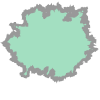

In [14]:
df_large_chickens.iloc[0]['Isochrone']

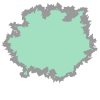

In [15]:
# shows the difference in resolution between the simplified and unsimplified isochrones
df_large_chickens.iloc[0]['Isochrone Cleaned']

In [16]:
# list the states that contain poultry plants
df_large_chickens.State.unique()

array(['AL', 'AR', 'CA', 'DE', 'FL', 'GA', 'KY', 'LA', 'MD', 'MN', 'MO',
       'MS', 'NC', 'NE', 'OK', 'PA', 'SC', 'TN', 'TX', 'VA', 'WA', 'WV',
       'IA'], dtype=object)

In [17]:
# reassign the dataframe to df_map for processing later in the notebook
df_map = df_large_chickens

### Create Map

In [18]:
# center of the USA: 37.0902° N, 95.7129° W
USA_LAT = 37.0902
USA_LNG = -95.7129

In [19]:
# folium requires these "color mapping functions" to add colors to the map
empty_color = lambda x: {
    "fillColor": "00" # empty
}

one_plant_color = lambda x: {
    "fillColor": "#ED7117" # carrot
}

two_plant_color = lambda x: {
    "fillColor": "#ED7117" # carrot
}

three_plant_color = lambda x: {
    "fillColor": "#9F2B68" # amaranth
}

four_plant_color = lambda x: {
    "fillColor": "#90ee90" # light green
}

#### Add Plants to Map Layer and Extract Isochrones for Geospatial Processing

In [20]:
# add markers and isochrones to map
isochrones = []
# driving_distance_layer = folium.map.FeatureGroup(name="60 Mile Driving Distance")
plants_layer = folium.map.FeatureGroup(name="Large Poultry Plants")

for index, row in df_map.iterrows():
    lat = str(row['latitude'])
    lng = str(row['longitude'])

    # set up plant tooltip
    name = row['Establishment Name']
    corp = row['Parent Corporation']
    address = row['Full Address']

    # add plant marker to map
    tooltip = folium.map.Tooltip(f"{name}<br>{address}<br>Parent Corporation: {corp}")
    folium.Marker(location=[lat, lng],tooltip=tooltip).add_to(plants_layer)

    isochrone = row['Isochrone Cleaned']
    isochrones.append(isochrone)
    
    # Can add the isochrones to the map, too, but this gets pretty cluttered with the other geospatial data
    # add driving radius isochrone to map layer
    # geojson = folium.GeoJson(row['Isochrone Cleaned'], style_function=empty_color)
    # geojson.add_to(driving_distance_layer)

In [21]:
len(isochrones)

138

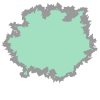

In [22]:
# example isochrone
isochrones[0]

#### Calculate Single-Plant Capture

In [23]:
# create single-plant capture area by removing one plant at a time and saving the area that is unique to that plant
single_plants_shapely = []
for index, poly in enumerate(isochrones):
    others = shapely.unary_union(isochrones[:index] + isochrones[index+1:])
    single_plant = shapely.difference(poly, others)
    single_plants_shapely.append(single_plant)

In [24]:
# create folium layer for single plant capture
single_plant_layer = folium.map.FeatureGroup(name="Access to 1 Plant")
single_plants_combined = shapely.unary_union(single_plants_shapely)
folium.GeoJson(single_plants_combined).add_to(single_plant_layer)

In [25]:
# calculate competitive area for filtering in the next stage
everything = shapely.unary_union(isochrones)
single_plant_combined = shapely.unary_union(single_plants_shapely)
competition_single_plant = shapely.difference(everything, single_plant_combined)

#### Calculate Two Plant Capture

In [26]:
# exclude any plants that are fully in single plant capture area
isochrones_shapely_two_plants = []
for isochrone in isochrones:
    if isochrone.intersection(competition_single_plant):
        isochrones_shapely_two_plants.append(isochrone)

In [27]:
len(isochrones_shapely_two_plants)

131

In [28]:
# logic here is similar to single plant capture with just a bit more complexity since we are now looking at two plant capture so we need to do a nested loop
two_plants_shapely = []
for i in range(len(isochrones_shapely_two_plants)):
    for j in range(i+1, len(isochrones_shapely_two_plants)):
        plant_1 = isochrones_shapely_two_plants[i]
        plant_2 = isochrones_shapely_two_plants[j]

        # check if there's an intersection between the areas
        if not plant_1.intersection(plant_2):
            continue
        else:
            two_plant_area = shapely.unary_union([plant_1,plant_2])

        # exclude first plant
        other_plants = isochrones_shapely_two_plants[:i]
        # exclude second plant
        other_plants += isochrones_shapely_two_plants[i+1:j]
        other_plants += isochrones_shapely_two_plants[j+1:]

        # find the area where there's only two plants
        others_combined = shapely.unary_union(other_plants)
        captured_area = shapely.difference(two_plant_area, others_combined) # returns the part of geometry a that does not intersect with geometry b
        # remove the area that is captured by only one of the plants
        captured_area = shapely.difference(captured_area, single_plant_combined)
        if captured_area:
            two_plants_shapely.append(captured_area)


In [29]:
len(two_plants_shapely)

351

In [30]:
two_plant_layer = folium.map.FeatureGroup(name="Access to 2 Plants")
two_plants_combined = shapely.unary_union(two_plants_shapely)
folium.GeoJson(two_plants_combined,style_function=two_plant_color).add_to(two_plant_layer)

In [31]:
# calculate competitive area for filtering in the next stage
competition_two_plant = shapely.difference(competition_single_plant, two_plants_combined)

#### Calculate Three Plant Competition Area

In [32]:
# exclude any plants that don't intersect with the competition area
isochrones_shapely_three_plants = []
for isochrone in isochrones:
    if isochrone.intersection(competition_two_plant):
        isochrones_shapely_three_plants.append(isochrone)

In [33]:
len(isochrones_shapely_three_plants)

125

In [34]:
# same idea as previous steps, now we just need to do this for three plants
three_plants_shapely = []
for i in range(len(isochrones_shapely_three_plants)):
    for j in range(i+1, len(isochrones_shapely_three_plants)):
        for k in range(j+1, len(isochrones_shapely_three_plants)):
            plant_1 = isochrones_shapely_three_plants[i]
            plant_2 = isochrones_shapely_three_plants[j]
            plant_3 = isochrones_shapely_three_plants[k]

            # check if there's an intersection between the areas
            if not plant_1.intersection(plant_2).intersection(plant_3):
                continue
            else:
                three_plant_area = shapely.unary_union([plant_1,plant_2,plant_3])

            # exclude first plant
            other_plants = isochrones_shapely_three_plants[:i]
            # exclude second plant
            other_plants += isochrones_shapely_three_plants[i+1:j]
            other_plants += isochrones_shapely_three_plants[j+1:k]
            # exclude third plant
            other_plants += isochrones_shapely_three_plants[k+1:]

            # find the area where there's only two plants
            others_combined = shapely.unary_union(other_plants)
            captured_area = shapely.difference(three_plant_area, others_combined) # returns the part of geometry a that does not intersect with geometry b
            # remove the area that is captured by only one of the plants
            captured_area = shapely.difference(captured_area, single_plant_combined)
            # remove the area that is captured by only two of the plants
            captured_area = shapely.difference(captured_area, two_plants_combined)
            if captured_area:
                three_plants_shapely.append(captured_area)


In [35]:
len(three_plants_shapely)

602

In [36]:
# create three plant layer
three_plant_layer = folium.map.FeatureGroup(name="Access to 3 Plants")
three_plants_combined = shapely.unary_union(three_plants_shapely)
folium.GeoJson(three_plants_combined,style_function=three_plant_color).add_to(three_plant_layer)

#### Calculate 4+ Plant Competition Area

In [37]:
# 4+ plants is everything else that is left over
four_plants_combined = shapely.difference(everything, single_plant_combined)
four_plants_combined = shapely.difference(four_plants_combined, two_plants_combined)
four_plants_combined = shapely.difference(four_plants_combined.buffer(0), three_plants_combined.buffer(0)) # add buffer(0) to handle floating point errors

In [38]:
# create folium layer
four_plant_layer = folium.map.FeatureGroup(name="Access to 4+ Plants")
folium.GeoJson(four_plants_combined,style_function=four_plant_color).add_to(four_plant_layer)

#### Calculate Captured Area

In [39]:
from pyproj import Geod

In [40]:
# example of calculating areas using pyproj
geod = Geod(ellps="WGS84")
poly_area, poly_perimeter = geod.geometry_area_perimeter(single_plant_combined)

In [41]:
# negative area just depends on whether the points are clockwise or counterclockwise — need to be careful with absolute values here
geod.geometry_area_perimeter(everything)

(-1051413229289.9025, 77319580.98908204)

In [42]:
# example calculation checking the ratio areas in each of the "capture zones"
single_plant_area = abs(geod.geometry_area_perimeter(single_plant_combined)[0]/geod.geometry_area_perimeter(everything)[0])
two_plant_area = abs(geod.geometry_area_perimeter(two_plants_combined)[0]/geod.geometry_area_perimeter(everything)[0])
three_plant_area = abs(geod.geometry_area_perimeter(three_plants_combined)[0]/geod.geometry_area_perimeter(everything)[0])
four_plant_area = abs(geod.geometry_area_perimeter(four_plants_combined)[0]/geod.geometry_area_perimeter(everything)[0])

In [43]:
single_plant_area, two_plant_area, three_plant_area, four_plant_area

(0.5251105301285375,
 0.24132431355133085,
 0.11007259982448879,
 0.12349255558835066)

In [44]:
# this should sum to 1 (or very close to it)
single_plant_area + two_plant_area + three_plant_area + four_plant_area

0.9999999990927079

#### Display Map

In [45]:
# create actual folium map object
m = folium.Map(location=[USA_LAT, USA_LNG],zoom_start=4)

In [46]:
# add each of our previously created layers to the folium map
plants_layer.add_to(m)
single_plant_layer.add_to(m)
two_plant_layer.add_to(m)
three_plant_layer.add_to(m)
four_plant_layer.add_to(m)
folium.map.LayerControl().add_to(m) # you need to add layer control *last* or else nothing will show up on the map
m

##### Save Map

In [47]:
# don't need to do this unless you want to actually save the map
# export html of map
m.save("../html/poultry-map-smoothed.html")

#### Include State Level Data

RAFI plans to examine this data on the state level. So, we join our previous GeoJSONs with state GeoJSONs.

In [49]:
us_states = gpd.read_file("../../data/gz_2010_us_040_00_500k.json").set_crs(WGS84)

In [50]:
us_states.head()

,GEO_ID,STATE,NAME,LSAD,CENSUSAREA,geometry
0,0400000US23,23,Maine,,30842.923,"MULTIPOLYGON (((-67.61976 44.51975, -67.61541 ..."
1,0400000US25,25,Massachusetts,,7800.058,"MULTIPOLYGON (((-70.83204 41.60650, -70.82373 ..."
2,0400000US26,26,Michigan,,56538.901,"MULTIPOLYGON (((-88.68443 48.11579, -88.67563 ..."
3,0400000US30,30,Montana,,145545.801,"POLYGON ((-104.05770 44.99743, -104.25015 44.9..."
4,0400000US32,32,Nevada,,109781.180,"POLYGON ((-114.05060 37.00040, -114.04999 36.9..."


In [51]:
# print the crs information of the states dataframe
us_states.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [52]:
# Example: you can calculate the centroid of a specific state
print(us_states.iloc[0]['geometry'].centroid)

POINT (-69.22532171969658 45.36948088392073)


In [53]:
# Which states do we have again?
df_large_chickens.State.unique()

array(['AL', 'AR', 'CA', 'DE', 'FL', 'GA', 'KY', 'LA', 'MD', 'MN', 'MO',
       'MS', 'NC', 'NE', 'OK', 'PA', 'SC', 'TN', 'TX', 'VA', 'WA', 'WV',
       'IA'], dtype=object)

In [54]:
abb2state = {
    'AL': "Alabama", 
    'AR': "Arkansas", 
    'CA': "California", 
    'DE': "Delaware", 
    'FL': "Florida", 
    'GA': "Georgia", 
    'KY': "Kentucky", 
    'LA': "Louisiana", 
    'MD': "Maryland", 
    'MN': "Minnesota", 
    'MO': "Missouri",
    'MS': "Mississippi", 
    'NC': "North Carolina", 
    'NE': "Nebraska", 
    'OK': "Oklahoma", 
    'PA': "Pennsylvania", 
    'SC': "South Carolina", 
    'TN': "Tennessee", 
    'TX': "Texas", 
    'VA': "Virginia", 
    'WA': "Washington", 
    'WV': "West Virginia",
    'IA': "Iowa"
}

In [55]:
# highlight function (change displayed on hover)
# again, Folium uses these kinda weird style functions that you pass when creating the layer
state_function = lambda x: {
  'color': 'red', # stroke becomes red
  'fillColor': '#00000000',
  # 'opacity' : 0.9,
  # 'weight': 4,
  'dashArray' : '3, 6' # transforms the solid stroke to a dashed stroke
}

In [56]:
# new map object that we will map state level data on
mm = folium.Map(location=[USA_LAT, USA_LNG],zoom_start=4)

In [57]:
# initialize new GeoPandas datafram that we will use to add our state level geojsons to
df_states = gpd.GeoDataFrame()

In [58]:
# We want to filter plants by corporation as well, so we create a list of dataframes where each dataframe in the list contains plant data for one corporation
corp_dfs = []
for corp in df_large_chickens['Parent Corporation'].unique():
    df = df_large_chickens[df_large_chickens['Parent Corporation'] == corp]
    corp_dfs.append(df)

In [59]:
len(corp_dfs)

21

In [60]:
states = df_large_chickens.State.unique()

In [61]:
len(states)

23

In [62]:
# let's check to make sure that our corporate dataframes were filtere properly
corp_dfs[0].head()

,Unnamed: 0,EstNumber,EstID,Parent Corporation,Establishment Name,State,Size,Animals Processed,Processed\nVolume\nCategory,Slaughter\nVolume\nCategory,Full Address,latitude,longitude,Isochrone,Isochrone Cleaned
71,71,P1317 + V1317,4495,Cargill,Wayne Farms LLC,AL,Large,Chicken,5.0,5.0,"700 McDonald Avenue, Albertville, AL 35950",34.260726,-86.203222,"POLYGON ((-86.08922 34.95820, -86.09322 34.953...","POLYGON ((-86.08922 34.95820, -86.09379 34.947..."
72,72,P7485 + V7485,4518,Cargill,Wayne Farms LLC,AL,Large,Chicken,5.0,5.0,"1020 County Road 114, Jack, AL 36346",31.500628,-85.903438,"POLYGON ((-86.10144 32.28215, -86.10341 32.280...","POLYGON ((-86.10144 32.28215, -86.09208 32.217..."
73,73,P912,4493,Cargill,"Wayne Farms, LLC",AL,Large,Chicken,5.0,5.0,"444 Baskin Street South, Union Springs, AL 36089",32.139166,-85.721704,"POLYGON ((-85.77570 32.87582, -85.77767 32.859...","POLYGON ((-85.77570 32.87582, -85.78170 32.852..."
74,74,P7342 + V7342,4516,Cargill,Wayne Farms LLC,AL,Large,Chicken,5.0,5.0,"808 Ross Clark Circle NE, Dothan, AL 36303",31.225754,-85.362068,"POLYGON ((-85.11607 32.00221, -85.11784 31.995...","POLYGON ((-85.11607 32.00221, -85.13107 31.945..."
75,75,P1235,4509,Cargill,Wayne Farms LLC,AL,Large,Chicken,5.0,5.0,"254 Ipsco Road, Decatur, AL 35601",34.607601,-87.042595,"POLYGON ((-86.88059 35.31872, -86.88225 35.314...","POLYGON ((-86.88059 35.31872, -86.89229 35.264..."


In [63]:
# create geometry for specific corporation
# join everythin in each corporate dataframe then add to a new list of geojsons
corps_joined = []
for corp_df in corp_dfs:
    corp_geomtery = corp_df['Isochrone Cleaned'].unary_union
    corp_data = {
        "parent_corporation": corp_df.iloc[0]["Parent Corporation"],
        "geometry": corp_geomtery,
    }
    corps_joined.append(corp_data)

In [64]:
# make one dataframe from list of dataframes
df_corps_joined = gpd.GeoDataFrame(corps_joined)

In [65]:
# let's make sure that this is what we expect
df_corps_joined.head()

,parent_corporation,geometry
0,Cargill,"MULTIPOLYGON (((-89.89523 30.87915, -89.87782 ..."
1,JBS,"MULTIPOLYGON (((-85.96557 31.96975, -85.98720 ..."
2,Koch Foods,"MULTIPOLYGON (((-86.55984 33.06343, -86.58926 ..."
3,Mar-Jac,"MULTIPOLYGON (((-89.26277 32.02025, -89.25345 ..."
4,Peco Foods,"MULTIPOLYGON (((-88.61549 32.31772, -88.60349 ..."


In [66]:
# now, we want to intersect the corporate geojsons with the state geojsons so we have a geojson for each valid corporation/state pairing
corp_state_geojsons = []
# create layers for each corporation in each state
for i, corp in df_corps_joined.iterrows():
    # create an intersection with each state's monopsony area
    for state in states:
        state_name = abb2state[state]
        state_layer = folium.map.FeatureGroup(name=state_name, show=False)
        state_geometry = us_states[us_states["NAME"] == state_name]['geometry'].to_crs(WGS84)
        state_center = state_geometry.to_crs(ALBERS_EQUAL_AREA).centroid.to_crs(WGS84)

        one_plant = shapely.intersection(single_plant_combined,state_geometry).set_crs(WGS84).iloc[0]
        one_plant_one_corp_one_state = shapely.intersection(one_plant,corp.geometry)

        # convert geomtery collections to multipolygons
        if isinstance(one_plant_one_corp_one_state, GeometryCollection):
            one_plant = MultiPolygon([g for g in one_plant_one_corp_one_state.geoms if isinstance(g, Polygon)])

        if one_plant_one_corp_one_state:
            one_plant_one_state_data = {
                "state": state_name,
                "geometry": one_plant_one_corp_one_state,
                "parent_corporation": corp.parent_corporation
            }

            corp_state_geojsons.append(one_plant_one_state_data)

In [67]:
len(corp_state_geojsons)

118

In [68]:
df_corp_state = gpd.GeoDataFrame(corp_state_geojsons)

In [69]:
# let's make sure this is what we expect
df_corp_state

,state,geometry,parent_corporation
0,Alabama,GEOMETRYCOLLECTION (POLYGON ((-88.43469 31.489...,Cargill
1,Arkansas,GEOMETRYCOLLECTION (POLYGON ((-93.52932 34.491...,Cargill
2,Florida,GEOMETRYCOLLECTION (POLYGON ((-84.24583 30.528...,Cargill
3,Georgia,GEOMETRYCOLLECTION (POLYGON ((-84.74386 30.782...,Cargill
4,Louisiana,GEOMETRYCOLLECTION (POLYGON ((-91.05980 30.854...,Cargill
...,...,...,...
113,Nebraska,"MULTIPOLYGON (((-96.40023 42.17148, -96.42407 ...",Costco
114,Iowa,"MULTIPOLYGON (((-96.26864 42.04231, -96.27143 ...",Costco
115,Pennsylvania,GEOMETRYCOLLECTION (POLYGON ((-77.20418 40.061...,Aterian Investment Partners
116,Maryland,GEOMETRYCOLLECTION (POLYGON ((-76.20696 39.721...,"Sechler Family Foods, Inc."


In [70]:
# Export corporate/state geojsons to file
df_corp_state.to_file("../data/all_states_with_parent_corp.geojson", driver="GeoJSON")

DriverError: Failed to create GeoJSON datasource: ../data/all_states_with_parent_corp.geojson: ../data/all_states_with_parent_corp.geojson: No such file or directory

### Old Code for Creating Map with State Level GeoJSONs

Code below here doesn't work anymore since we are now exporting the state level GeoJSON file

In [80]:
# create layers for each state
for state in df_large_chickens.State.unique():
    state_name = abb2state[state]
    state_layer = folium.map.FeatureGroup(name=state_name, show=False)
    state_geometry = us_states[us_states["NAME"] == state_name]['geometry'].to_crs(WGS84)
    state_center = state_geometry.to_crs(ALBERS_EQUAL_AREA).centroid.to_crs(WGS84)

    one_plant = shapely.intersection(single_plant_combined,state_geometry).set_crs(WGS84).iloc[0]
    two_plant = shapely.intersection(two_plants_combined,state_geometry).set_crs(WGS84).iloc[0]
    three_plant = shapely.intersection(three_plants_combined.buffer(0),state_geometry).set_crs(WGS84).iloc[0]
    four_plant = shapely.intersection(four_plants_combined,state_geometry).set_crs(WGS84).iloc[0]
    
    everything = shapely.unary_union([one_plant, two_plant, three_plant, four_plant])
    everything_area = geod.geometry_area_perimeter(everything)[0]

    # calculate captured area
    one_plant_area = abs(geod.geometry_area_perimeter(one_plant)[0]/everything_area)
    two_plant_area = abs(geod.geometry_area_perimeter(two_plant)[0]/everything_area)
    three_plant_area = abs(geod.geometry_area_perimeter(three_plant)[0]/everything_area)
    four_plant_area = abs(geod.geometry_area_perimeter(four_plant)[0]/everything_area)
    # except Exception as e:
    #     print(f"{state_name} has an exception")
    #     two_plant_area = 0
    #     three_plant_area = 0
    #     four_plant_area = 0
    #     # continue

    tooltip = folium.map.Tooltip(f'1 Plant: {one_plant_area:.1%}<br>2 Plants: {two_plant_area:.1%}<br>3 Plants: {three_plant_area:.1%}<br>4+ Plants: {four_plant_area:.1%}<br>')              
    # {name}<br>{address}<br>Parent Corporation: {corp}")
    state_marker = folium.Marker(location=[state_center.y.iloc[0],state_center.x.iloc[0]],tooltip=tooltip,icon=folium.map.Icon(color='white')).add_to(state_layer)

    # add to folium map
    folium.GeoJson(state_geometry, style_function=state_function).add_to(state_layer)
    folium.GeoJson(one_plant).add_to(state_layer)
    folium.GeoJson(two_plant, style_function=two_plant_color).add_to(state_layer)
    folium.GeoJson(three_plant, style_function=three_plant_color).add_to(state_layer)
    folium.GeoJson(four_plant, style_function=four_plant_color).add_to(state_layer)

    state_layer.add_to(mm)

    # add to geopandas dataframe
    # one_plant_geojson = {
    #     'type': 'Feature',
    #     'properties': {
    #         "state": state_name,
    #         "plant_access": "1",
    #         "area": geod.geometry_area_perimeter(one_plant)[0]
    #     },
    #     'geometry': mapping(one_plant)
    # }
    # two_plant_geojson = {
    #     'type': 'Feature',
    #     'properties': {
    #         "state": state_name,
    #         "plant_access": "1",
    #         "area": geod.geometry_area_perimeter(two_plant)[0]
    #     },
    #     'geometry': mapping(two_plant)
    # }
    # three_plant_geojson = {
    #     'type': 'Feature',
    #     'properties': {
    #         "state": state_name,
    #         "plant_access": "1",
    #         "area": geod.geometry_area_perimeter(three_plant)[0]
    #     },
    #     'geometry': mapping(three_plant)
    # }
    # four_plant_geojson = {
    #     'type': 'Feature',
    #     'properties': {
    #         "state": state_name,
    #         "plant_access": "1",
    #         "area": geod.geometry_area_perimeter(four_plant)[0]
    #     },
    #     'geometry': mapping(four_plant)
    # }

    # one_plant_row = {
    #     "state": state_name,
    #     "plant_access": "1",
    #     "area": geod.geometry_area_perimeter(one_plant)[0],
    #     'geometry': one_plant
    # }
    # two_plant_row = {
    #     "state": state_name,
    #     "plant_access": "2",
    #     "area": geod.geometry_area_perimeter(two_plant)[0],
    #     'geometry': two_plant
    # }
    # three_plant_row = {
    #     "state": state_name,
    #     "plant_access": "3",
    #     "area": geod.geometry_area_perimeter(three_plant)[0],
    #     'geometry': three_plant
    # }
    # four_plant_row = {
    #     "state": state_name,
    #     "plant_access": "4",
    #     "area": geod.geometry_area_perimeter(four_plant)[0],
    #     'geometry': four_plant
    # }

    areas = []
    for shape in [one_plant, two_plant, three_plant, four_plant]:
        area = abs(geod.geometry_area_perimeter(shape)[0])
        areas.append(area)

    geometries = [one_plant, two_plant, three_plant, four_plant]
    geometries_clean = []
    for geo in geometries:
        if isinstance(geo, GeometryCollection):
            geometries_clean.append(MultiPolygon([g for g in geo.geoms if isinstance(g, Polygon)]))
        else:
            geometries_clean.append(geo)

    state_data = {
        "state": state_name,
        "plant_access": [1,2,3,4],
        "area": areas,
        "geometry": geometries_clean
    }

    df_single_state = gpd.GeoDataFrame(state_data)
    df_states = pd.concat([df_states, df_single_state])

In [81]:
df_large_chickens['Parent Corporation'].unique()

array(['Cargill', 'JBS', 'Koch Foods', 'Mar-Jac', 'Peco Foods', 'Tyson',
       'Bachoco', "George's", 'Simmons Foods', 'Foster Farms',
       'Harim Group', 'Mountaire', 'Perdue', 'Fieldale Farms Corporation',
       'Independent', 'House of Raeford', 'Amick', 'Case Farms', 'Costco',
       'Aterian Investment Partners', 'Sechler Family Foods, Inc.'],
      dtype=object)

In [82]:
df_states

,state,plant_access,area,geometry
0,Alabama,1,2.967512e+10,"MULTIPOLYGON (((-88.41502 31.20756, -88.41887 ..."
1,Alabama,2,2.814999e+10,"MULTIPOLYGON (((-86.19561 31.52426, -86.14170 ..."
2,Alabama,3,1.251645e+10,"MULTIPOLYGON (((-87.39686 34.02887, -87.44460 ..."
3,Alabama,4,2.616577e+10,"MULTIPOLYGON (((-86.14896 33.63073, -86.15120 ..."
0,Arkansas,1,4.062816e+10,"MULTIPOLYGON (((-94.00708 33.20157, -94.01254 ..."
...,...,...,...,...
3,West Virginia,4,7.266928e+08,"MULTIPOLYGON (((-79.05848 38.88617, -79.05760 ..."
0,Iowa,1,1.523342e+10,"MULTIPOLYGON (((-95.99897 41.84374, -95.96559 ..."
1,Iowa,2,0.000000e+00,POLYGON EMPTY
2,Iowa,3,0.000000e+00,POLYGON EMPTY


In [83]:
df_states.iloc[91].geometry.is_empty

True

In [84]:
~df_states.geometry.is_empty

0     True
1     True
2     True
3     True
0     True
     ...  
3     True
0     True
1    False
2    False
3    False
Length: 92, dtype: bool

In [85]:
df_states = df_states[~df_states.geometry.is_empty]

In [86]:
df_states.to_file("all_states.geojson", driver="GeoJSON")

In [87]:
example_geojson = gpd.read_file("../data/health-factors-county-chrr.geojson")

In [88]:
geojson = {
    'type': 'Feature',
    'properties': {
        "state": "Alaska"
    },
    'geometry': mapping(single_plants_combined)
}

In [89]:
plants_layer.add_to(mm)
folium.map.LayerControl().add_to(mm)

In [90]:
mm

In [348]:
mm.save("../html/poultry-state-map.html")

In [224]:
one_plant_ga = shapely.intersection(single_plant_combined,us_states[us_states["NAME"] == "Georgia"]['geometry']).set_crs("EPSG:4326")
two_plant_ga = shapely.intersection(two_plants_combined,us_states[us_states["NAME"] == "Georgia"]['geometry']).set_crs("EPSG:4326")
three_plant_ga = shapely.intersection(three_plants_combined,us_states[us_states["NAME"] == "Georgia"]['geometry']).set_crs("EPSG:4326")
four_plant_ga = shapely.intersection(four_plants_combined,us_states[us_states["NAME"] == "Georgia"]['geometry']).set_crs("EPSG:4326")

In [218]:
one_plant_ga

28    MULTIPOLYGON (((-85.04724 31.12008, -85.00485 ...
Name: geometry, dtype: geometry

In [228]:
all_ga = shapely.unary_union([one_plant_ga, two_plant_ga, three_plant_ga, four_plant_ga])

In [235]:
plants_layer.add_to(mm)
driving_distance_layer.add_to(mm)

In [238]:
folium.GeoJson(one_plant_ga).add_to(mm)
folium.GeoJson(two_plant_ga, style_function=two_plant_color).add_to(mm)
folium.GeoJson(three_plant_ga, style_function=three_plant_color).add_to(mm)
folium.GeoJson(four_plant_ga, style_function=four_plant_color).add_to(mm)

In [239]:
mm